# Imports and Setup


In [1]:
!git clone https://github.com/Hari31416/TorchLight
!cp -r ./TorchLight/* ./

Cloning into 'TorchLight'...
remote: Enumerating objects: 242, done.
remote: Counting objects: 100% (242/242), done.
remote: Compressing objects: 100% (162/162), done.
remote: Total 242 (delta 148), reused 171 (delta 77), pack-reused 0 (from 0)
Receiving objects: 100% (242/242), 4.02 MiB | 45.19 MiB/s, done.
Resolving deltas: 100% (148/148), done.


In [2]:
from torchlight.utils import (
    create_simple_logger,
    T,
    A,
    M,
)
from torchlight.objective import (
    create_objective_with_multi_hook,
)
from torchlight.image import get_image
from torchlight.optimize import FeatureViz
from torchlight.models import InceptionV1
from torchlight.io import show_images, show_image, animate_sequence

import torch

import numpy as np
from PIL import Image
from typing import List, Union, Tuple, Callable, Optional

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
logger = create_simple_logger(
    "style_transfer", set_level_to_all_loggers=True, level="warning"
)  # avoid spamming the console with debug and log messages


# Style Transfer

In [4]:
TRANSFER_INDEX = 0
CONTENT_INDEX = 1
STYLE_INDEX = 2

model = InceptionV1().eval().to(device)

Downloading: "https://github.com/ProGamerGov/pytorch-old-tensorflow-models/raw/master/inception5h.pth" to /root/.cache/torch/hub/checkpoints/inception5h.pth
100%|██████████| 27.0M/27.0M [00:00<00:00, 283MB/s]


## Loading Image and Image Parameterization

In [5]:
def load_image(path, h: Optional[int] = None, w: Optional[int] = None) -> A:
    """Loads an image from a given path and resizes it to the given dimensions. Returns the image as a numpy array."""
    image = Image.open(path)
    if h is not None and w is not None:
        image = image.resize((w, h))
    image = np.array(image)
    image = image / 255.0
    return image


def style_transfer_param(
    content_image: A, style_image: A, decorrelate: bool = True, fft: bool = True
) -> Tuple[List[T], Callable[[], T]]:
    """Creates the image parameters for the style transfer optimization."""
    shape = content_image.shape[:2]  # assume we use content_image.shape
    params, image = get_image(shape[1], shape[0], decorrelate=decorrelate, fft=fft) # get image takes w and then h

    def inner():
        style_transfer_input = image()[0]
        content_input = (
            torch.tensor(np.transpose(content_image, [2, 0, 1])).float().to(device)
        )
        style_input = (
            torch.tensor(
                np.transpose(style_image[: shape[0], : shape[1], :], [2, 0, 1])
            )
            .float()
            .to(device)
        )
        return torch.stack([style_transfer_input, content_input, style_input])

    return params, inner

## Loss Functions

In [6]:
def mean_L1(a: T, b: T) -> T:
    """Computes the mean L1 loss between two tensors."""
    return torch.abs(a - b).mean()


def activation_difference(
    layer_outputs: List[T],
    activation_loss_f: Callable[[T], T] = mean_L1,
    transform_f: Optional[Callable[[T], T]] = None,
    difference_to: int = CONTENT_INDEX,
) -> T:
    """Computes the activation difference between two images. If `transform_f` is supplied, it is applied to the activations before computing the loss using the `activation_loss_f` function. The `difference_to` parameter specifies the index of the image in `layer_outputs` to which the difference is computed."""
    # first we collect the (constant) activations of image we're computing the difference to
    image_activations = [layer_output[difference_to] for layer_output in layer_outputs]
    if transform_f is not None:
        image_activations = [transform_f(act) for act in image_activations]

    # we also set get the activations of the optimized image which will change during optimization
    optimization_activations = [
        layer_output[TRANSFER_INDEX] for layer_output in layer_outputs
    ]
    if transform_f is not None:
        optimization_activations = [
            transform_f(act) for act in optimization_activations
        ]

    # we use the supplied loss function to compute the actual losses
    losses = [
        activation_loss_f(a, b)
        for a, b in zip(image_activations, optimization_activations)
    ]
    return sum(losses) / len(losses)


def gram_matrix(features: T, normalize: bool = True) -> T:
    """Calculates the Gram matrix of a given tensor. If `normalize` is set to `True`, the Gram matrix is normalized by the number of elements in the tensor."""
    C, H, W = features.shape
    features = features.view(C, -1)
    gram = torch.matmul(features, torch.transpose(features, 0, 1))
    if normalize:
        gram = gram / (H * W)
    return gram

## Optimization

In [7]:
def style_transfer(
    content_image_path: str,
    style_image_path: str,
    style_layers: List[str],
    content_layers: List[str],
    h: int = 512,
    w: int = 512,
    fft: bool = True,
    decorrelate: bool = True,
    content_weight: int = 200,
    thresholds: List[int] = [512],
    lr: float = 0.05,
    plot_compare_images: bool = True,
    show_progress: bool = False,
    image_plot_freq: Optional[int] = None,
) -> List[A]:
    """Create a style transfer image from a content and style image."""
    content_image = load_image(content_image_path, h=h, w=w)
    style_image = load_image(style_image_path, h=h, w=w)
    param_f = lambda: style_transfer_param(
        content_image, style_image, decorrelate=decorrelate, fft=fft
    )

    style_weight = 1

    content_obj = create_objective_with_multi_hook(
        extractor_function=activation_difference,
        layer_names=content_layers,
        extractor_function_kwargs={"difference_to": CONTENT_INDEX},
    )
    style_obj = create_objective_with_multi_hook(
        extractor_function=activation_difference,
        layer_names=style_layers,
        extractor_function_kwargs={
            "difference_to": STYLE_INDEX,
            "transform_f": gram_matrix,
        },
    )
    objective = content_weight * content_obj + style_weight * style_obj

    fv = FeatureViz(model=model, objective=objective)
    images = fv.visualize(
        param_f,
        show_last_image=False,
        show_progress=show_progress,
        thresholds=thresholds,
        lr=lr,
        plot_images=True if image_plot_freq is not None else False,
        freq=image_plot_freq if image_plot_freq is not None else 10000,
    )
    if plot_compare_images:
        show_images(images[-1], labels = ["Style Transferred", "Content", "Style"])
    return images

In [8]:
style_layers = [
    "conv2d2",
    "mixed3a",
    "mixed4a",
    "mixed4b",
    "mixed4c",
]

content_layers = [
    "mixed3b",
]

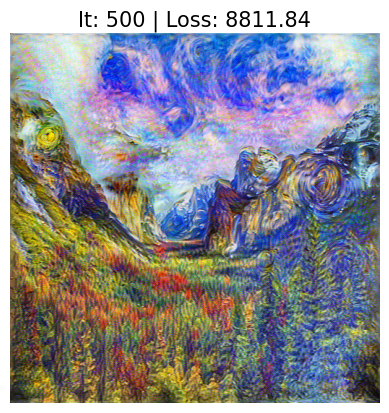

Style Transferred,Content,Style

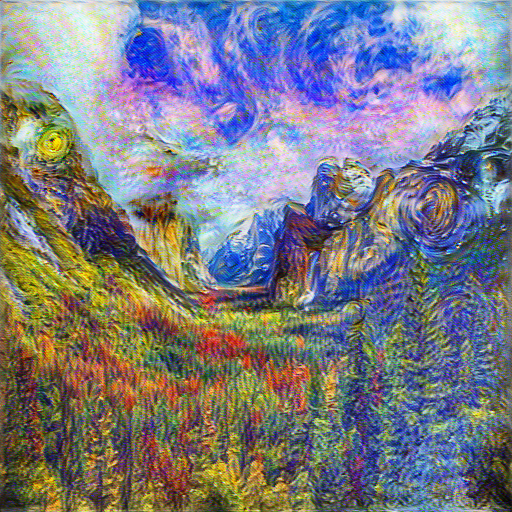
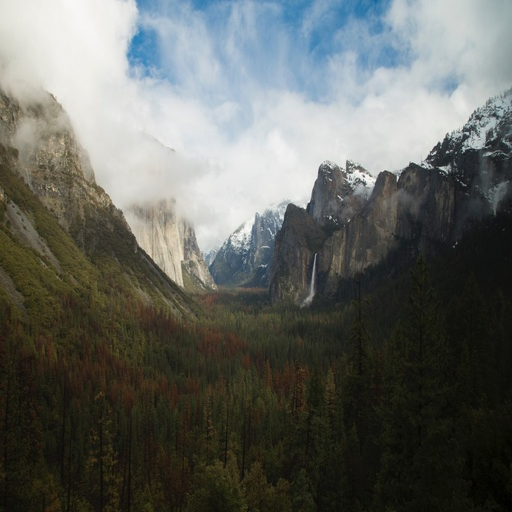
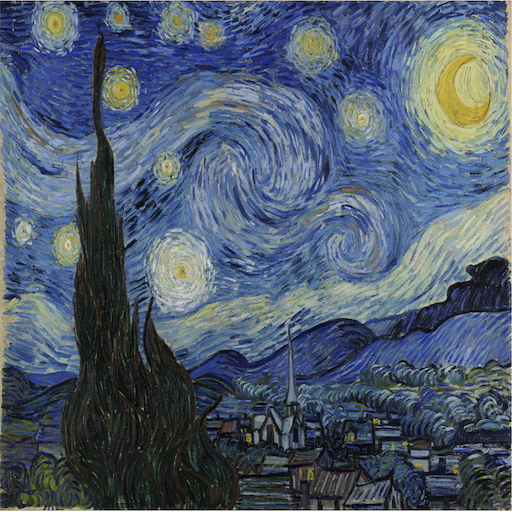

In [9]:
images = style_transfer(
    "images/landscape.jpg",
    "images/vangogh.png",
    style_layers,
    content_layers,
    w=512,
    h=512,
    fft=True,
    decorrelate=True,
    content_weight=200,
    thresholds=range(0, 501, 100),
    lr=0.05,
    plot_compare_images=True,
    show_progress=False,
    image_plot_freq = 10,
)

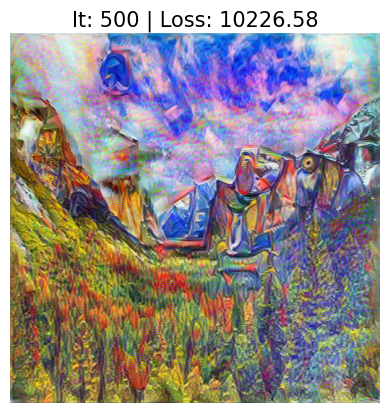

Style Transferred,Content,Style

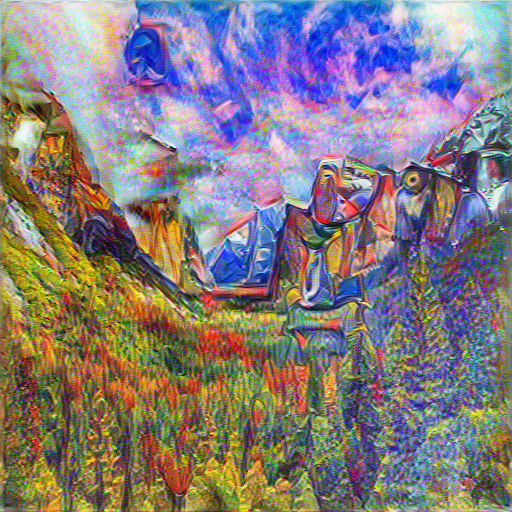
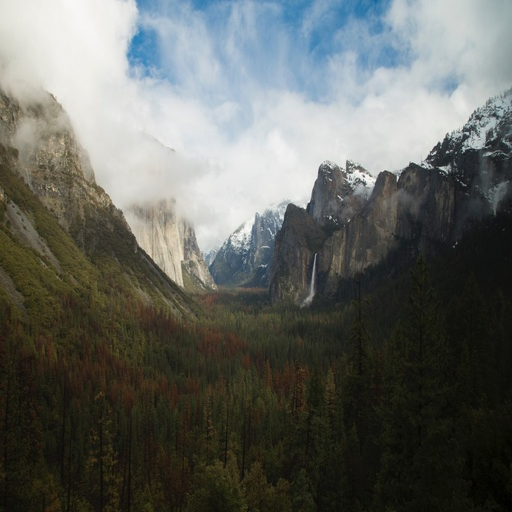
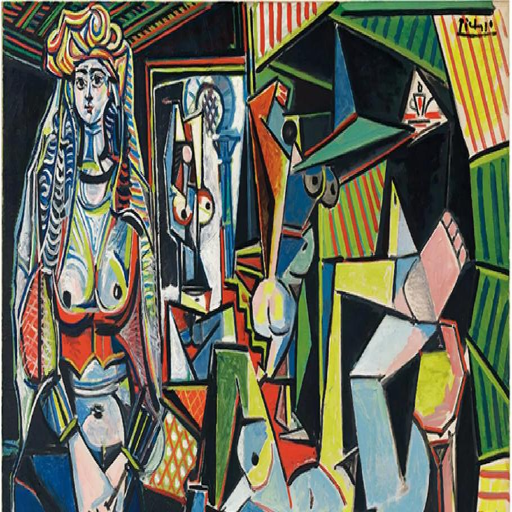

In [10]:
images = style_transfer(
    "images/landscape.jpg",
    "images/picasso.png",
    style_layers,
    content_layers,
    w=512,
    h=512,
    fft=True,
    decorrelate=True,
    content_weight=200,
    thresholds=range(0, 501, 100),
    lr=0.05,
    plot_compare_images=True,
    show_progress=False,
    image_plot_freq = 10,
)

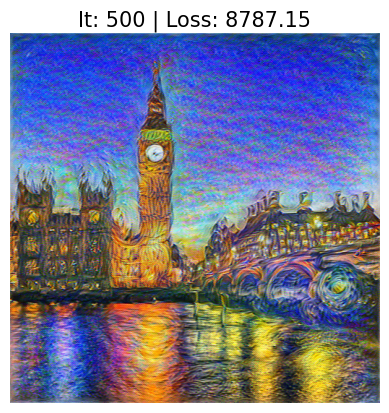

Style Transferred,Content,Style

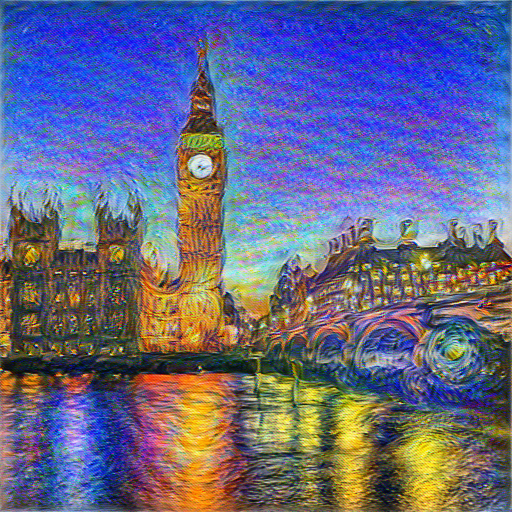
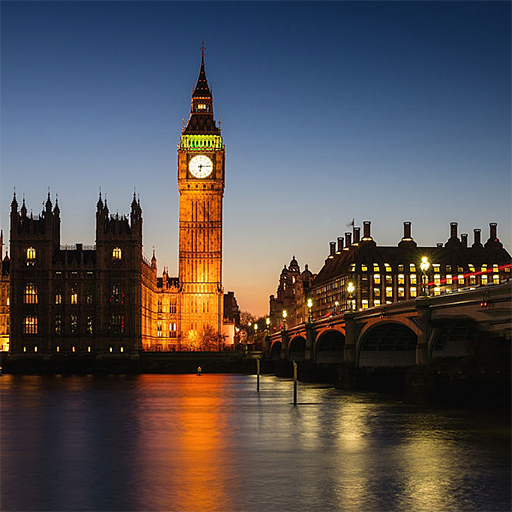
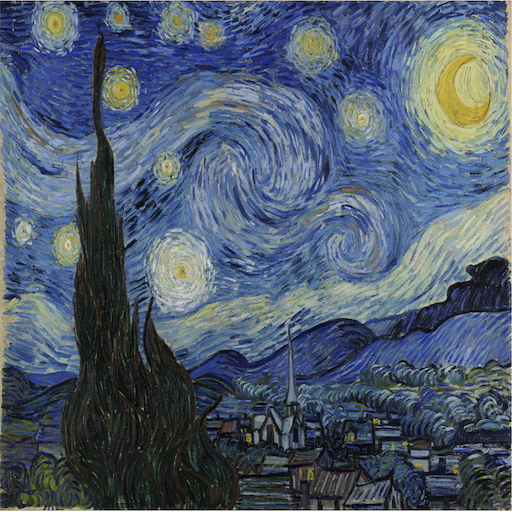

In [11]:
images = style_transfer(
    "images/big_ben.png",
    "images/vangogh.png",
    style_layers,
    content_layers,
    w=512,
    h=512,
    fft=True,
    decorrelate=True,
    content_weight=200,
    thresholds=range(0, 501, 100),
    lr=0.05,
    plot_compare_images=True,
    show_progress=False,
    image_plot_freq = 10,
)

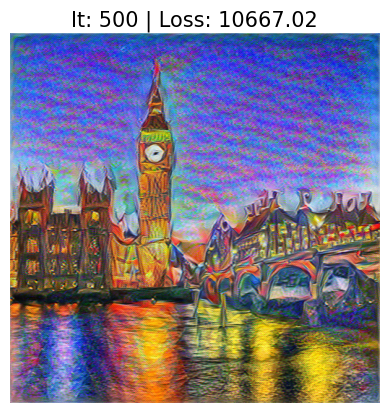

Style Transferred,Content,Style

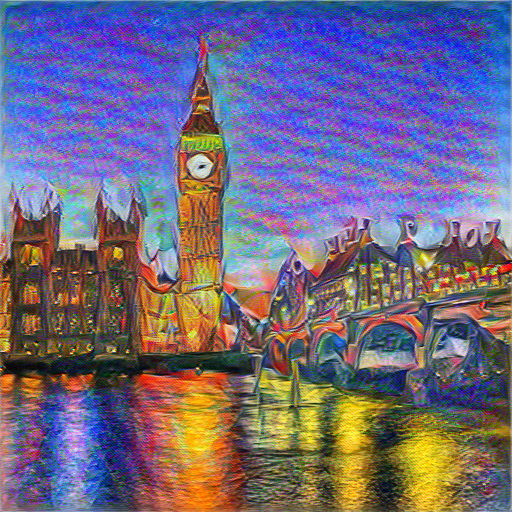
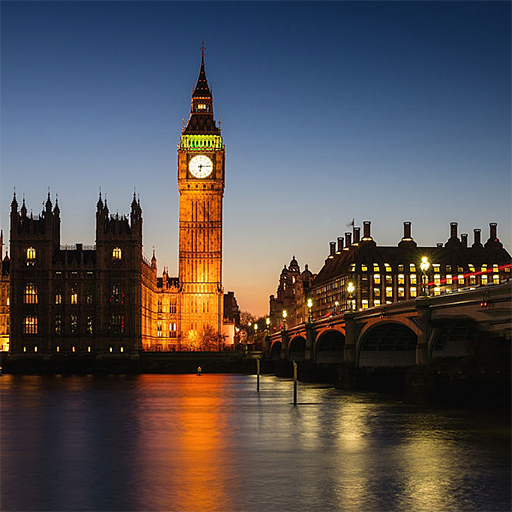
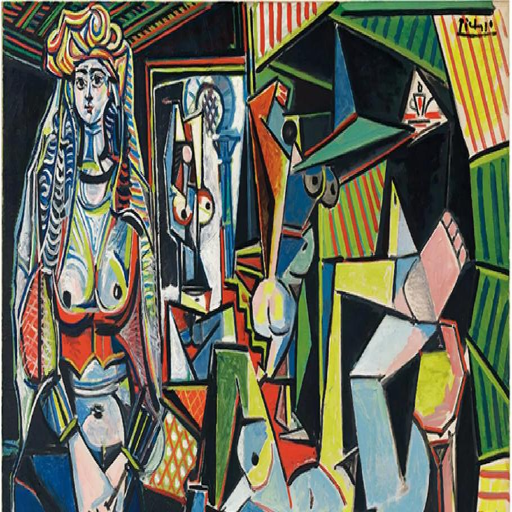

In [12]:
images = style_transfer(
    "images/big_ben.png",
    "images/picasso.png",
    style_layers,
    content_layers,
    w=512,
    h=512,
    fft=True,
    decorrelate=True,
    content_weight=200,
    thresholds=range(0, 501, 100),
    lr=0.05,
    plot_compare_images=True,
    show_progress=False,
    image_plot_freq = 10,
)